# <u>Amazon Review Sentiment Analysis</u>

In [1]:
#importing libraries
import pandas as pd
import warnings
warnings.filterwarnings('ignore')
import fasttext
import spacy  
nlp = spacy.load("en_core_web_sm") 
from collections import Counter              #importing counter
import re                                    #regular exppression
    
stop_words = nlp.Defaults.stop_words 
from sklearn.feature_extraction.text import TfidfVectorizer  
from sklearn.linear_model import LogisticRegression     
from sklearn.metrics import accuracy_score,recall_score,confusion_matrix,precision_score,f1_score
from time import time

from sklearn.naive_bayes import MultinomialNB
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sb
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)

### Reading Dataset

In [131]:
#importing the merged file 
sentiment=pd.read_csv('sentiment0.csv')

In [5]:
sentiment.columns    #checking columns

Index(['overall', 'verified', 'reviewTime', 'reviewerID', 'asin',
       'reviewerName', 'text', 'sentiment_score_(compound)', 'sentiment',
       'rating'],
      dtype='object')

###  Data Preprocessing

In [9]:
#function for removing stopwords
def stop_words(rev):
    rev=str.lower(rev)                           #lowering the content of file
    rev=re.sub('\\W+',' ',rev)
    rev=re.sub('\\d+',' ',rev)
    rev=re.sub('\\s+',' ',rev)                    #replacing white spaces with space
    doc= nlp(rev)
    x=[]
    for token in doc:                           #4.For quick analysis, stop words should be absent from the documents.
        if token.is_stop==False:
            x.append(str(token))
    x1=str(x)
    x1 = re.sub(',',' ',x1)
    x1=re.sub('\\W+',' ',x1)
    return x1 

In [7]:
sentiment['text']=sentiment['text'].apply(lambda d: stop_words(d))  # removing stopwords from reviews

In [8]:
#CONSIDERING SAMPLE DATA 
sample1=sentiment.sample(n=10000,replace=True,random_state=1)

In [10]:
d=nlp(' '.join(sample1['text']))    #converting into string

In [19]:
#Lemmatization
for word in d:
    print(word,'=>',word.lemma_)

  =>  
market => market
gauge => gauge
owned => own
having => having
compare => compare
crummy => crummy
supplied => supply
table => table
saws => saw
gauge => gauge
accurate => accurate
relies => relie
loosening => loosen
screws => screw
establish => establish
initial => initial
square => square
setting => setting
assuming => assume
accurate => accurate
square => square
issue => issue
like => like
stops => stop
making => make
adjustments => adjustment
easy => easy
commented => comment
tape => tape
measure => measure
insert => insert
backwards => backwards
instead => instead
trying => trying
read => read
upside => upside
removed => remove
use => use
tape => tape
measure => measure
set => set
stops => stop
usually => usually
cut => cut
slightly => slightly
longer => long
need => need
use => use
fine => fine
adjustment => adjustment
feature => feature
creep => creep
exact => exact
measurement => measurement
desired => desire
having => have
cutoff => cutoff
table => table
helps => helps
p

In [ ]:
#Part-of-speech 
for word in d:
    print(word,'\t',word.pos_,'\t',word.tag_)

  	 SPACE 	 _SP
market 	 NOUN 	 NN
gauge 	 NOUN 	 NN
owned 	 VERB 	 VBN
having 	 AUX 	 VBG
compare 	 VERB 	 VB
crummy 	 NOUN 	 NN
supplied 	 VERB 	 VBN
table 	 NOUN 	 NN
saws 	 NOUN 	 NNS
gauge 	 NOUN 	 NN
accurate 	 ADJ 	 JJ
relies 	 NOUN 	 NNS
loosening 	 VERB 	 VBG
screws 	 NOUN 	 NNS
establish 	 VERB 	 VBP
initial 	 ADJ 	 JJ
square 	 ADJ 	 JJ
setting 	 NOUN 	 NN
assuming 	 VERB 	 VBG
accurate 	 ADJ 	 JJ
square 	 ADJ 	 JJ
issue 	 NOUN 	 NN
like 	 ADP 	 IN
stops 	 NOUN 	 NNS
making 	 VERB 	 VBG
adjustments 	 NOUN 	 NNS
easy 	 ADV 	 RB
commented 	 VERB 	 VBN
tape 	 NOUN 	 NN
measure 	 NOUN 	 NN
insert 	 PROPN 	 NNP
backwards 	 ADV 	 RB
instead 	 ADV 	 RB
trying 	 AUX 	 VBG
read 	 VERB 	 VB
upside 	 ADV 	 RB
removed 	 VERB 	 VBN
use 	 NOUN 	 NN
tape 	 NOUN 	 NN
measure 	 NOUN 	 NN
set 	 VERB 	 VBN
stops 	 NOUN 	 NNS
usually 	 ADV 	 RB
cut 	 VERB 	 VBN
slightly 	 ADV 	 RB
longer 	 ADV 	 RBR
need 	 VERB 	 VBP
use 	 NOUN 	 NN
fine 	 ADJ 	 JJ
adjustment 	 NOUN 	 NN
feature 	 NOUN 	 NN
cree

In [22]:
#Function for getting sentiment score
def sentiment_scores(sentence):
 
    # Create a SentimentIntensityAnalyzer object.
    sid_obj = SentimentIntensityAnalyzer()
 
    # polarity_scores method of SentimentIntensityAnalyzer
    # object gives a sentiment dictionary.
    # which contains pos, neg, neu, and compound scores.
    sentiment_dict_c = sid_obj.polarity_scores(sentence).get('compound')  #accessing only compound score
    return sentiment_dict_c

In [45]:
#Function for labelling and rating sentiment score as negative,positive or neutral / 0,1,2
def scores(k):
    if k >= 0.05 :
        req_value="Positive"
        number = 2
    elif k <= - 0.05 :
        req_value="Negative"
        number = 0
    else :
        req_value="Neutral"
        number = 1
    return req_value,number

In [35]:
#Adding Sentiment and rating column
sentiment['sentiment_score_(compound)']=sentiment['text'].apply(lambda x: sentiment_scores(x))
sentiment['sentiment']=sentiment['sentiment_score_(compound)'].apply(lambda x: scores(x)[0])
sentiment['rating']=sentiment['sentiment_score_(compound)'].apply(lambda x: scores(x)[1])

In [137]:
sentiment=pd.read_csv('sentiment_final.csv')         #importing sentiment  final file

In [99]:
sentiment.shape

(2867974, 10)

In [114]:
sentiment

,overall,verified,reviewTime,reviewerID,asin,reviewerName,text,sentiment_score_(compound),sentiment,rating
0,5,True,01-28-2018,AL19QO4XLBQPU,0982085028,J. Mollenkamp,returned decided product stars,0.0000,Neutral,1
1,5,True,11-30-2017,A1I7CVB7X3T81E,0982085028,warfam,awesome heater electrical requirements makes ...,0.8481,Positive,2
2,5,True,09-12-2017,A1AQXO4P5U674E,0982085028,gbieber2,keeps mist wood trim bendable stars,0.0000,Neutral,1
3,4,True,07-19-2017,AIRV678P7C4NK,0982085028,Justin Banner,far hooked tested filled gallon bucket hot wa...,0.7964,Positive,2
4,1,True,05-25-2017,A22I5QDNTNECDW,0982085028,daveparker,installed months ago instructions easy worked...,-0.8271,Negative,0
...,...,...,...,...,...,...,...,...,...,...
2867969,5,True,09-06-2018,AYE6G11DODB4A,B01HJ6NHD4,eml58,great product great price fast shipping stars,0.8481,Positive,2
2867970,4,True,08-27-2018,A1X3HBLFQLPHYV,B01HJ6NHD4,Bob32927,liked cover covers long time good cover money,0.6908,Positive,2
2867971,5,True,10-03-2018,A3FWXCF60VTX4Y,B01HJATY32,Dave Dunn Wilmer,nice quality grilling table grilling stuff ea...,0.9821,Positive,2
2867972,5,True,02-12-2018,A3JNRP1X81U8KC,B01HJEAT3C,Bradley Henley,pulley shipped described pulley mower deck sh...,0.0000,Neutral,1


In [135]:
#SAMPLING WITH 100000 ROWS
sample1=sentiment.sample(n=100000,random_state=1)

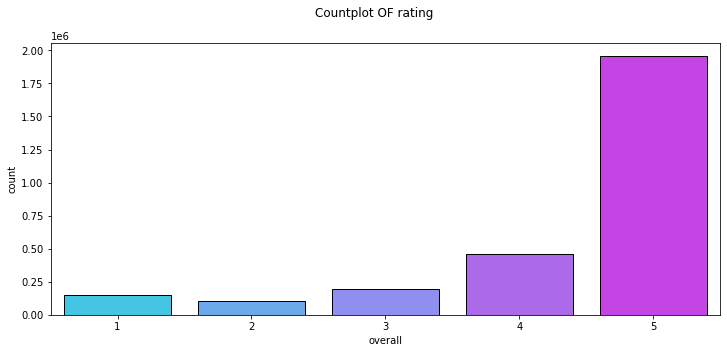

In [15]:
#Countplot of rating 
plt.figure(figsize=(12,5),facecolor='white')
plt.suptitle('Countplot OF rating')
sb.countplot(x='overall',data = sentiment,ec='black',palette='cool');

##### Through the counplot, we can see that maximum products have received 5 Rating by the customers.

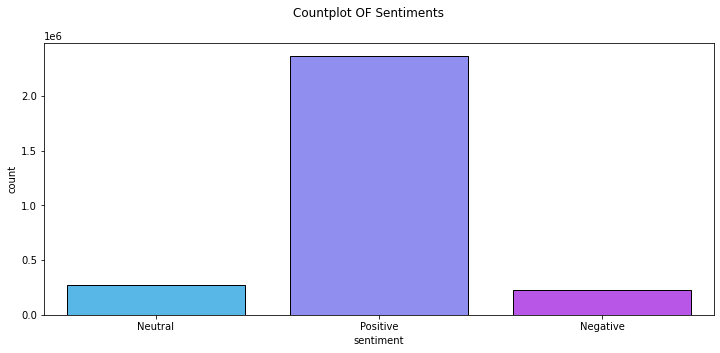

In [16]:
#countplot of sentiments
plt.figure(figsize=(12,5),facecolor='white')
plt.suptitle('Countplot OF Sentiments')
sb.countplot(x='sentiment',data = sentiment,ec='black',palette='cool');

##### Through the countplot of sentiments, we can infer that maximum reviews are reflecting positive sentiment.

# Modeling

### Logistic Regression (OneVsRestClassifier)

In [7]:
#splitting into train and test data
from sklearn.model_selection import train_test_split
x_train ,x_test,y_train,y_test=train_test_split(sentiment['text'],sentiment['rating'],test_size=0.25 ,random_state=42)

In [8]:
#using TF-IDF Vectorizer 
t1=time()
cv = TfidfVectorizer(max_features=1000)
X_train = cv.fit_transform(x_train)
X_test = cv.transform(x_test)
t2=time()
print(t2-t1)

117.61841177940369


In [95]:
#Modeling using OneVsRestClassifier
from sklearn.multiclass import OneVsRestClassifier
model=LogisticRegression()
ovr2 = OneVsRestClassifier(model)

#Model fitting
ovr2.fit(X_train,y_train)

# Make predictions on the test data
y_pred = ovr2.predict(X_test)

# Calculate the accuracy, recall, F1-score, and precision of the model
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred,average='weighted')
f1 = f1_score(y_test, y_pred,average='weighted')
precision = precision_score(y_test, y_pred,average='weighted')
print("Accuracy:", accuracy)
print("Recall:", recall)
print("F1-score:", f1)
print("Precision:", precision)
print('********************')
print('confusion_matrix')
print(confusion_matrix(y_test,y_pred))

Accuracy: 0.9444067872255556
Recall: 0.9444067872255556
F1-score: 0.9426302198192924
Precision: 0.943673040089511
********************
confusion_matrix
[[ 35906   6600  14455]
 [  1976  62845   3649]
 [  5332   7848 578383]]


### LogisticRegression hyper parameter tuning

In [27]:
#CONSIDERING SAMPLE DATA 
sample=sentiment.sample(n=100000,replace=True,random_state=1)
x_train2,x_test2,y_train2,y_test2=train_test_split(sample.text,sample.rating, test_size = 0.20, random_state = 12)

from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split


# Define the parameter grid for the logistic regression model
param_grid = {'C': [0.01, 0.1, 1, 10, 100], 'penalty': ['l1', 'l2']}   #c=   Regularization is a technique used to prevent overfitting in machine learning models. It adds a penalty term to the cost function that the model optimizes, which discourages the model from assigning too much weight to any single feature.

# Create a logistic regression model
logreg = LogisticRegression()

# Use GridSearchCV to perform hyperparameter tuning
grid_search = GridSearchCV(logreg, param_grid, cv=5)   #cv=5 This means that the data will be divided into 5 equal-sized folds, and the logistic regression model will be trained and evaluated 5 times, each time using a different fold as the testing set and the remaining 4 folds as the training set.
grid_search.fit(X_train2, y_train2)

# Print the best hyperparameters
print("Best hyperparameters: ", grid_search.best_params_)

y_pred22 = grid_search.predict(X_test2)
from sklearn.metrics import classification_report

y_pred22 = grid_search.predict(X_test2)
print(classification_report(y_test2, y_pred22))

Best hyperparameters:  {'C': 10, 'penalty': 'l2'}
              precision    recall  f1-score   support

           0       0.77      0.65      0.71      1601
           1       0.82      0.87      0.84      1874
           2       0.97      0.97      0.97     16525

    accuracy                           0.94     20000
   macro avg       0.85      0.83      0.84     20000
weighted avg       0.94      0.94      0.94     20000



### Naive Bayes

In [ ]:
#SAMPLING WITH 100000 ROWS
sample1=sentiment.sample(n=100000,random_state=1)

In [136]:
sentiment

,overall,verified,reviewTime,reviewerID,asin,reviewerName,text
0,5,True,01-28-2018,AL19QO4XLBQPU,0982085028,J. Mollenkamp,returned decided product stars
1,5,True,11-30-2017,A1I7CVB7X3T81E,0982085028,warfam,awesome heater electrical requirements makes ...
2,5,True,09-12-2017,A1AQXO4P5U674E,0982085028,gbieber2,keeps mist wood trim bendable stars
3,4,True,07-19-2017,AIRV678P7C4NK,0982085028,Justin Banner,far hooked tested filled gallon bucket hot wa...
4,1,True,05-25-2017,A22I5QDNTNECDW,0982085028,daveparker,installed months ago instructions easy worked...
...,...,...,...,...,...,...,...
2867969,5,True,09-06-2018,AYE6G11DODB4A,B01HJ6NHD4,eml58,great product great price fast shipping stars
2867970,4,True,08-27-2018,A1X3HBLFQLPHYV,B01HJ6NHD4,Bob32927,liked cover covers long time good cover money
2867971,5,True,10-03-2018,A3FWXCF60VTX4Y,B01HJATY32,Dave Dunn Wilmer,nice quality grilling table grilling stuff ea...
2867972,5,True,02-12-2018,A3JNRP1X81U8KC,B01HJEAT3C,Bradley Henley,pulley shipped described pulley mower deck sh...


In [138]:
#CONSIDERING SAMPLE DATA 
sample=sentiment.sample(n=100000,replace=True,random_state=1)
x_train2,x_test2,y_train2,y_test2=train_test_split(sample.text,sample.rating, test_size = 0.20, random_state = 12)

In [139]:
#Using TF-IDF Vectorizer
t1=time()
cv = TfidfVectorizer(max_features=1000)
X_train2 = cv.fit_transform(x_train2)
X_test2 = cv.transform(x_test2)
t2=time()
print(t2-t1)

3.324786424636841


In [15]:
#from sklearn.naive_bayes import MultinomialNB
from sklearn.naive_bayes import MultinomialNB

clf=MultinomialNB()
clf.fit(X_train2, y_train2) #training
# predict
y_pred2 = clf.predict(X_test2)

# compute the performance measures\n"
print('accuracy:', accuracy_score(y_test2, y_pred2))
print('recall:', recall_score(y_test2, y_pred2, average='weighted'))
print('f1-score:', f1_score(y_test2, y_pred2, average='weighted'))
print('precision:', precision_score(y_test2, y_pred2, average='weighted'))

accuracy: 0.8442
recall: 0.8442
f1-score: 0.7886970295813356
precision: 0.8532221763851161


In [ ]:
# hyperparameter tuning 

In [142]:
# X_train2 = X_train2.toarray()
# X_test2 = X_test2.toarray()
from sklearn.naive_bayes import MultinomialNB
from sklearn.model_selection import GridSearchCV

# Define the parameter grid for the model
param_grid = {'alpha': [0.1, 0.5, 1, 2, 5]}  # Smoothing is a technique used to avoid zero probabilities in the model, which can cause problems when making predictions. The 'alpha' parameter controls the amount of smoothing applied to the model's predictions by adding a small positive number to the count of each feature for each class. This has the effect of "smoothing" out the probability estimates and it is used to prevent overfitting.

# Create the classifier
mnb = MultinomialNB()
grid_search = GridSearchCV(mnb, param_grid, cv=5)
grid_search.fit(X_train2, y_train2)


y_pred = grid_search.predict(X_test2)
print(classification_report(y_test2, y_pred))

              precision    recall  f1-score   support

           0       0.86      0.07      0.14      1601
           1       0.95      0.15      0.26      1874
           2       0.84      1.00      0.91     16525

    accuracy                           0.85     20000
   macro avg       0.88      0.41      0.44     20000
weighted avg       0.86      0.85      0.79     20000



### FastText

In [16]:
#Split the dataframe into train and test.
train_df, test_df = train_test_split(sample, test_size=0.3, random_state=13)
print(train_df.shape)
print(test_df.shape)

(70000, 10)
(30000, 10)


In [42]:
#Processing train file for fasttext classification 
with open('train_fastext1.txt','w+', encoding="utf-8") as train_file:
       for i in train_df.index:
        labels = ''
        category=str(train_df['rating'][i])
        labels ='__label__' + category
        line = labels + ' '+train_df['text'][i]
        train_file.write(str(line)+'\n')

In [43]:
#Processing test file for fasttext classification 
with open('test_fastext1.txt','w+', encoding="utf-8") as test_file:
    for i in test_df.index:
        labels = ''
        category=str(test_df['rating'][i])
        labels ='__label__'+ category
        line = labels + ' '+test_df['text'][i]
        test_file.write(str(line)+'\n')

In [17]:
#Perform multi-label classification with fastText"
time1=time()
model_sup = fasttext.train_supervised(input='train_fastext1.txt', lr=0.5, epoch=30, wordNgrams=3, bucket=20000)
test_num, precision, recall = model_sup.test('test_fastext1.txt', k=1, threshold=0.1) # k=1 its takes 1 label2 
time2=time()
print(time2-time1)

217.89168047904968


In [81]:
f_score = (2*precision*recall)/(precision+recall) # epoch read data agian and again,
print('test_num =',test_num)
print('precision=',round(precision,2))
print('recall =' ,round(recall,2))
print('f_score=',round(f_score,2))

262.6583869457245
test_num = 29694
precision= 0.94
recall = 0.94
f_score= 0.94


In [58]:
for i in [5,10,15]:
    for j in [0.1,0.5,1]:
        for k in [1,2,3]:
            model_sup = fasttext.train_supervised(input='train_fastext1.txt', lr=j, epoch=i, wordNgrams=k, bucket=20000)
            test_num, precision, recall = model_sup.test('test_fastext1.txt', k=1, threshold=0.1)
            
            f_score = (2*precision*recall)/(precision+recall)
            print('lr =',j,'epoch=',i,'wordngrams =',k)
            print('test_num =',test_num,'precision =',precision,'recall =',recall,'f_score =',f_score)
            print('*************************************************************************************')

lr = 0.1 epoch= 5 wordngrams = 1
test_num = 29694 precision = 0.965245504142251 recall = 0.965245504142251 f_score = 0.965245504142251
*************************************************************************************
lr = 0.1 epoch= 5 wordngrams = 2
test_num = 29694 precision = 0.9523809523809523 recall = 0.9523809523809523 f_score = 0.9523809523809523
*************************************************************************************
lr = 0.1 epoch= 5 wordngrams = 3
test_num = 29694 precision = 0.9435912979053007 recall = 0.9435912979053007 f_score = 0.9435912979053007
*************************************************************************************
lr = 0.5 epoch= 5 wordngrams = 1
test_num = 29694 precision = 0.9658853640466087 recall = 0.9658853640466087 f_score = 0.9658853640466087
*************************************************************************************
lr = 0.5 epoch= 5 wordngrams = 2
test_num = 29694 precision = 0.9527498063516654 recall = 0.952717720751667

In [112]:
#Perform multi-label classification with fastText"
time1=time()
model_sup1 = fasttext.train_supervised(input='train_fastext1.txt', lr=0.1, epoch=10, wordNgrams=1, bucket=20000)
test_num, precision, recall = model_sup1.test('test_fastext1.txt', k=1, threshold=0.1) # k=1 its takes 1 label 
time2=time()
print(time2-time1)

f_score = (2*precision*recall)/(precision+recall) # epoch read data agian and again,
print('test_num =',test_num)
print('precision=',round(precision,2))
print('recall =' ,round(recall,2))
print('f_score=',round(f_score,2))

64.95330595970154
test_num = 29694
precision= 0.97
recall = 0.97
f_score= 0.97


In [111]:
test_num, precision, recall = model_sup.test('test_fastext1.txt', k=1, threshold=0.1) # k=1 its takes 1 label 
f_score

0.9660537482319661

In [113]:
import numpy as np

check = []
for k in np.arange(1,10,1):
    for t in np.arange(0.1,1,0.1):
        test_num, precision, recall = model_sup1.test('test_fastext1.txt', k=k, threshold=t)
        f_score = (2*precision*recall)/(precision+recall)
        check.append(f_score)

list1 = []
list2 = []

for k in np.arange(1,10,1):
      for t in np.arange(0.1,1,0.1):
        list1.append(k) 
        list2.append(t)
    
mydf = pd.DataFrame([list1,list2,check]).transpose()
mydf.columns = ['K Value','Threshold value','f_score']

print(mydf.sort_values('f_score',ascending=False))


    K Value  Threshold value   f_score
40      5.0              0.5  0.966546
13      2.0              0.5  0.966546
76      9.0              0.5  0.966546
4       1.0              0.5  0.966546
67      8.0              0.5  0.966546
..      ...              ...       ...
72      9.0              0.1  0.947283
45      6.0              0.1  0.947283
27      4.0              0.1  0.947283
63      8.0              0.1  0.947283
18      3.0              0.1  0.947283

[81 rows x 3 columns]


In [103]:
g=mydf.sort_values('f_score',ascending=False)

In [108]:
g.head(50)

,K Value,Threshold value,f_score
40,5.0,0.5,0.937790
67,8.0,0.5,0.937790
31,4.0,0.5,0.937790
13,2.0,0.5,0.937790
49,6.0,0.5,0.937790
22,3.0,0.5,0.937790
58,7.0,0.5,0.937790
76,9.0,0.5,0.937790
4,1.0,0.5,0.937790
3,1.0,0.4,0.937672


### Model evaluaton:

In [129]:
#FINAL DATAFRAME FOR COMPARISON 
final_df1 = pd.DataFrame()
final_df1['Model']=['Logistic Regression','Naive Bayes','FastText']
final_df1['F1-score']=['0.96','0.78','0.94']
final_df1['Recall']=['0.96','0.84','0.94']
final_df1['Precision']=['0.96','0.85','0.94']

In [143]:
final_df1

,Model,F1-score,Recall,Precision
0,Logistic Regression,0.96,0.96,0.96
1,Naive Bayes,0.78,0.84,0.85
2,FastText,0.94,0.94,0.94


#####   CONCLUSION : Logistic Regression & FastText has better F1-Score than Naïve Bayes, therefore they can be a good choice for classification. 
 

### Testng  model on new data set

In [67]:
appliances=pd.read_csv('appliances.csv')
appliances=appliances[['reviewText','rating']]
appliances.isnull().sum()

reviewText    0
rating        0
dtype: int64

In [65]:
#Processing test file for fasttext classification 
with open('test_fastext_appliances.txt','w+', encoding="utf-8") as test_file:
    for i in appliances.index:
        labels = ''
        category=str(appliances['rating'][i])
        labels ='__label__'+ category
        line = labels + ' '+appliances['reviewText'][i]
        test_file.write(str(line)+'\n')

In [74]:
test_num, precision, recall = model_sup.test('test_fastext_appliances.txt', k=1, threshold=0.1) # k=1 its takes 1 label 
time2=time()
print(time2-time1)

f_score = (2*precision*recall)/(precision+recall) # epoch read data agian and again,
print('test_num =',test_num)
print('precision=',(precision))
print('recall =' ,(recall))
print('f_score=',(f_score))

927.5872066020966
test_num = 2277
precision= 0.9921465968586387
recall = 0.9986824769433466
f_score= 0.9954038082731451


In [79]:
import numpy as np

check = []
for k in np.arange(1,10,1):
    for t in np.arange(0.1,1,0.1):
        test_num, precision, recall = model_sup.test('test_fastext_appliances.txt', k=k, threshold=t)
        f_score = (2*precision*recall)/(precision+recall)
        check.append(f_score)

list1 = []
list2 = []

for k in np.arange(1,10,1):
      for t in np.arange(0.1,1,0.1):
        list1.append(k) 
        list2.append(t)
    
mydf = pd.DataFrame([list1,list2,check]).transpose()
mydf.columns = ['K Value','Threshold value','f_score']

print(mydf.sort_values('f_score',ascending=False))


    K Value  Threshold value   f_score
12      2.0              0.4  0.997146
30      4.0              0.4  0.997146
21      3.0              0.4  0.997146
75      9.0              0.4  0.997146
39      5.0              0.4  0.997146
..      ...              ...       ...
26      3.0              0.9  0.947052
44      5.0              0.9  0.947052
17      2.0              0.9  0.947052
35      4.0              0.9  0.947052
80      9.0              0.9  0.947052

[81 rows x 3 columns]


In [86]:
appliances['predicted']=appliances['reviewText'].apply(lambda x : model_sup.predict(x)[0])

In [128]:
appliances.head(50)

,reviewText,rating,predicted
0,like vent house warmer winter sanded painted ...,2,"(__label__2,)"
1,good item,2,"(__label__2,)"
2,fit new lg dryer perfectly,2,"(__label__2,)"
3,good value electric dryers,2,"(__label__2,)"
4,price delivery excellent,2,"(__label__2,)"
5,purchasaed new dryer want reuse cord old unit...,2,"(__label__2,)"
6,good value,2,"(__label__2,)"
7,works great loved till didn t buy warranty need,2,"(__label__2,)"
8,luved months worked great little bullet shape...,2,"(__label__2,)"
9,careful newair stand products newair broke ho...,2,"(__label__2,)"
